In [2]:

from control import matlab as mtl
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from scipy.signal import freqz



# Projeto 2 - Sinais e Sistemas em Tempo Discreto - 2023/02
# Identificação
## Nome: 
## Matrícula: 

# Funções utilizadas.

Coloque abaixo as funções desenvolvidas para este projeto.

# Questão 1

Um sistema de aquisição de dados de eletrocardiograma foi ligado de forma equivocada perto demais da rede elétrica. Assim, a interferência da rede elétrica (a 60 Hz) aparece de forma marcante no sinal adquirido. O seu objetivo é projetar um filtro digital para eliminar totalmente o ruído em 60Hz. A frequência de amostragem do sistema é: 

$$ f_a = 500~Hz $$ 

Siga as questões abaixo.

## Questão 1a (0.5  pontos)

Projete o filtro em questão utilizando a colocação de pólos e zeros no plano z. Desenhe o diagrama de pólos e zeros do filtro projetado, indicando quais pólos e zeros foram indicados e o porquê destes pólos/zeros terem sido escolhidos. Você pode inserir o seu projeto como uma imagem escaneada abaixo.

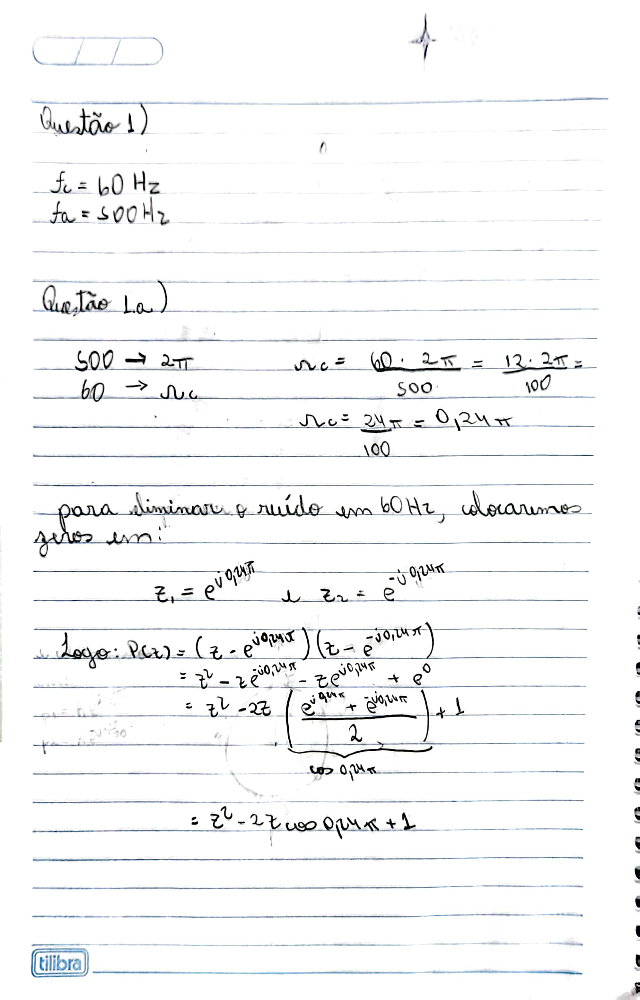

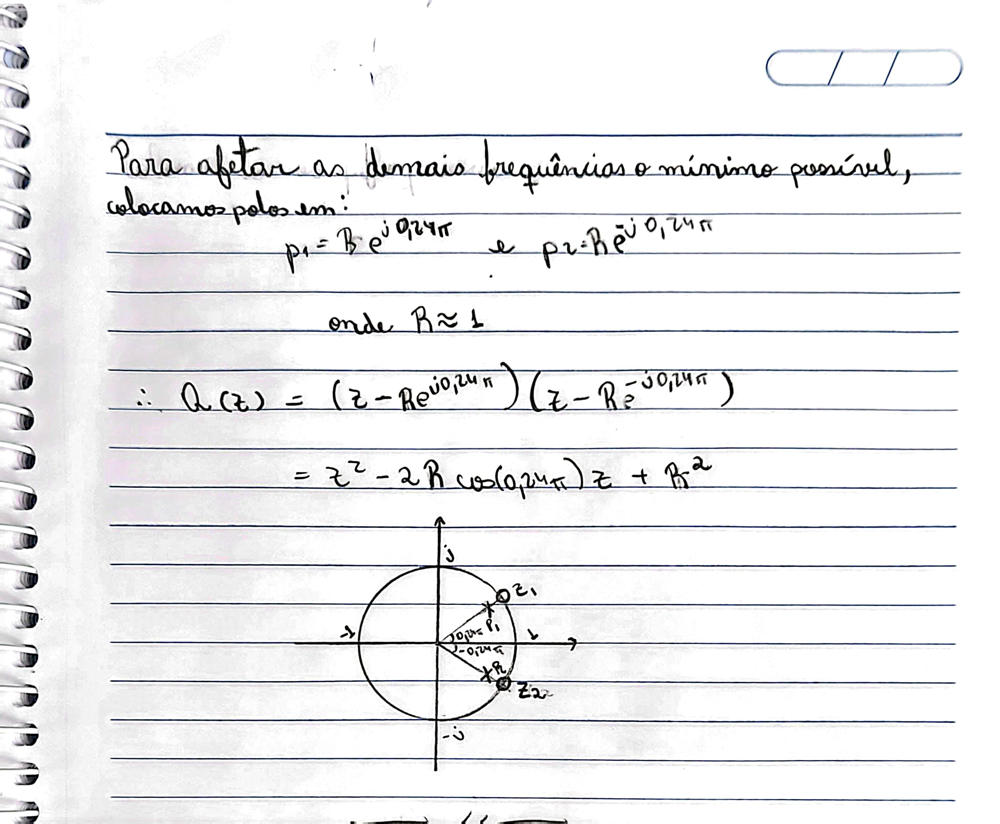

In [3]:
#Resposta da questão 1a

## Questão 1b (0.5 pontos)

A partir do diagrama desenvolvido na questão anterior, escreva a função de transferência do filtro H(z) e a equação de diferenças do sistema que realiza o filtro. Você pode inserir sua resposta como uma imagem escaneada abaixo.

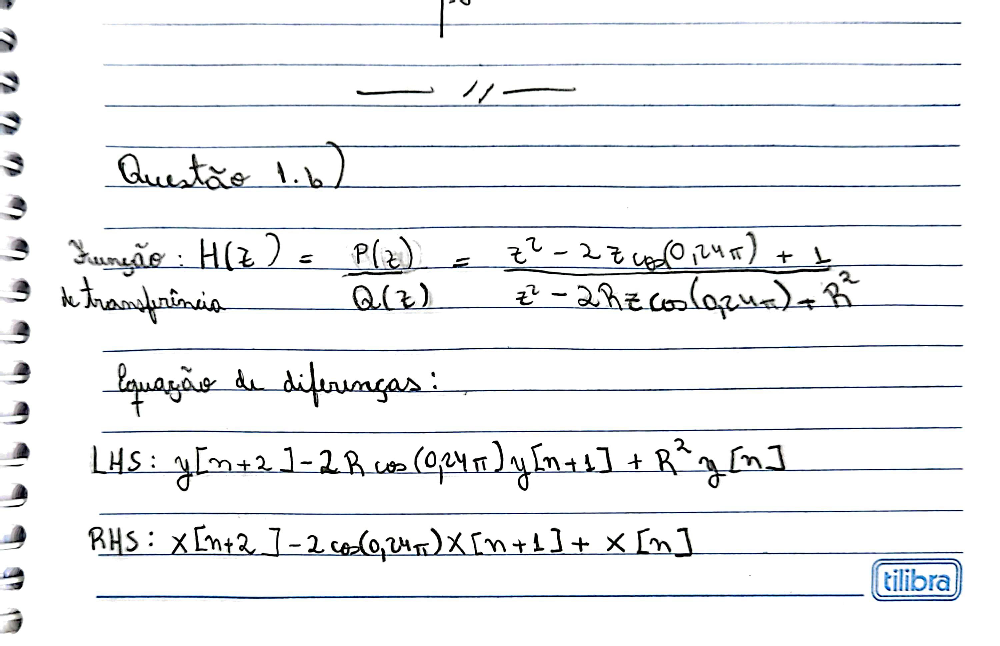

In [4]:
#Resposta da questão 1b

## Questão 1c (1  ponto)

Plote a **resposta em frequência** do filtro projetado (magnitude e fase). 

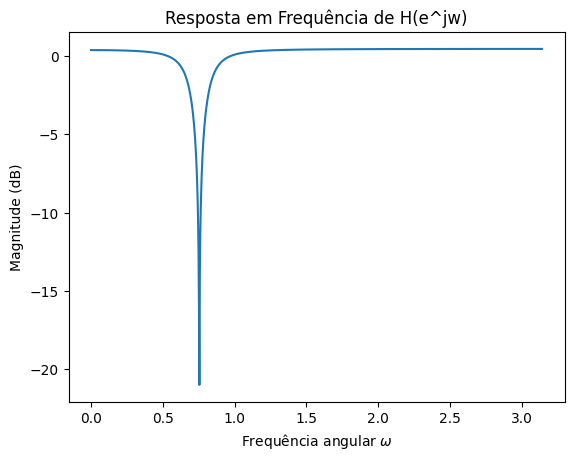

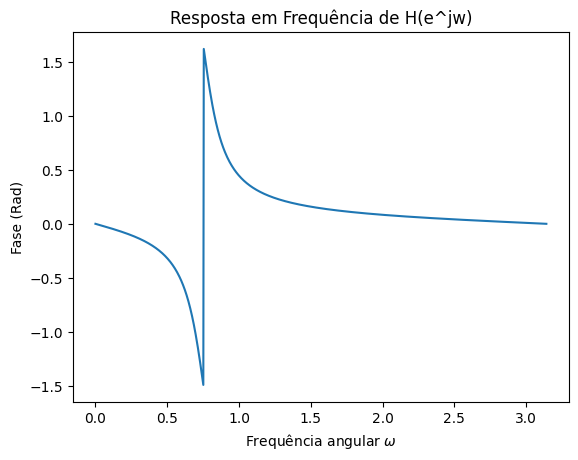

In [5]:
#Resposta da questão 1c

lam = 0.9

wc = 0.24 * np.pi

z1 = np.exp(1j * wc)
z2 = np.exp(-1j * wc)

b0 = 1
b1 = -2*np.cos(wc)
b2 = 1

p1 = lam * z1
p2 = lam * z2

a0 = 1
a1 = -2*lam*np.cos(wc)
a2 = lam**2

Omega = np.linspace(0, np.pi, 1000)
w_axis = np.exp(1j*Omega)

H = (b0 * (w_axis**2) + b1*w_axis + b2) / (a0 * w_axis**2 + a1* w_axis + a2)
H_abs = abs(H)
H_phase_deg = np.angle(H)


H_mag_db = 10 * np.log10(abs(H))
H_phase = np.angle(H)

plt.plot(Omega, H_mag_db)
plt.title('Resposta em Frequência de H(e^jw)')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Magnitude (dB)')
plt.show()

plt.plot(Omega, H_phase)
plt.title('Resposta em Frequência de H(e^jw)')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Fase (Rad)')
plt.show()



## Questão 1d (0.5  pontos)

Carregue o sinal de ECG "noisy_ecg_data.mat" e aplique o filtro projetado neste sinal. Plote o sinal antes da filtragem (x[n]) e o sinal após a filtragem (y[n]).

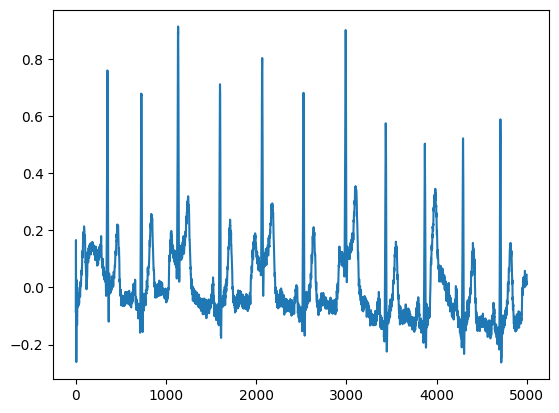

In [6]:
#Resposta da questão 1d

sinal = sp.io.loadmat('noisy_ecg_data.mat')['noisy_ecg'].ravel()
novo_sinal = np.zeros(len(sinal))

novo_sinal[0] = sinal[0]
novo_sinal[1] = sinal[1] +b1*sinal[0] - a1*novo_sinal[0]

for i in range(2, len(novo_sinal)):
    novo_sinal[i] = b0 * sinal[i] + b1*sinal[i-1] + b2*sinal[i-2] - a1*novo_sinal[i-1] - a2*novo_sinal[i-2]
        
plt.plot(novo_sinal)

# Questão 2

Ainda no sistema de aquisição de dados de eletrocardiograma, mais tarde foi verificado que, mesmo depois de resolvido o problema da interferência da rede elétrica (i.e., o sinal não tem um ruído específico em 60Hz), o sinal adquirido tinha bastante ruído de alta frequência (acima de 35Hz). O objetivo desta questão é projetar um filtro digital para atenuar as frequências acima de 35Hz. A frequência de amostragem do sistema é:

$$ f_a = 500~Hz $$

Siga as questões abaixo.

## Questão 2a (0.5  pontos)

Projete o filtro em questão utilizando a colocação de pólos e zeros no plano z. Desenhe o diagrama de pólos e zeros do filtro projetado, indicando quais pólos e zeros foram indicados e o porquê destes pólos/zeros terem sido escolhidos. Você pode inserir o seu projeto como uma imagem escaneada abaixo.

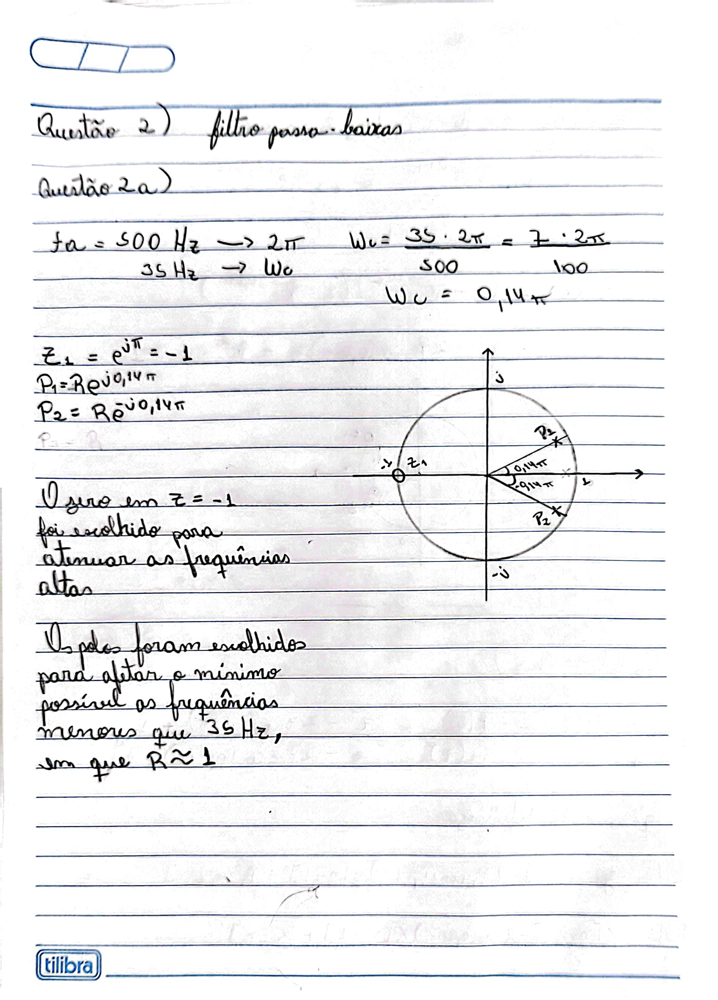

In [7]:
#Resposta da questão 2a

## Questão 2b (0.5 pontos)

A partir do diagrama desenvolvido na questão anterior, escreva a função de transferência do filtro H(z) e a equação de diferenças do sistema que realiza o filtro. Você pode inserir sua resposta como uma imagem escaneada abaixo.

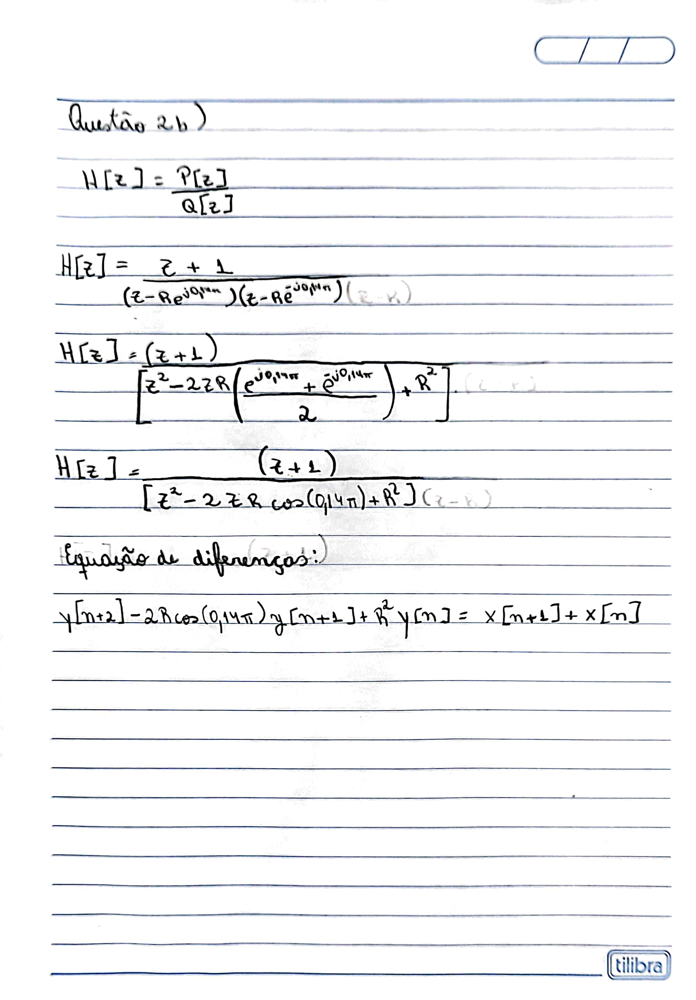

In [8]:
#Resposta da questão 2b

## Questão 2c (1  ponto)

Plote a **resposta em frequência** do filtro projetado (magnitude e fase). 

C:\Users\lucac\AppData\Local\Temp\ipykernel_4148\1358073119.py:20: RuntimeWarning: divide by zero encountered in log10
  H_mag_db = 10 * np.log10(abs(H))


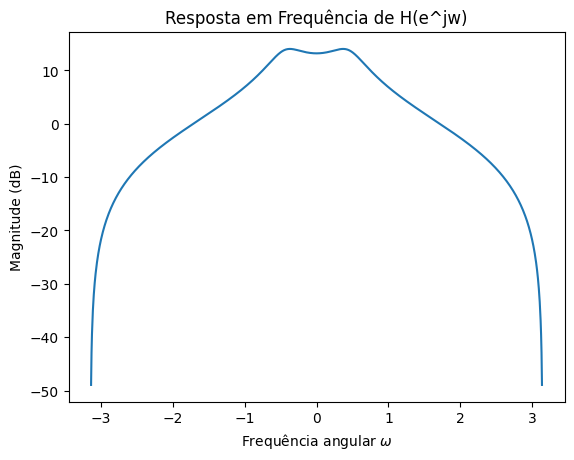

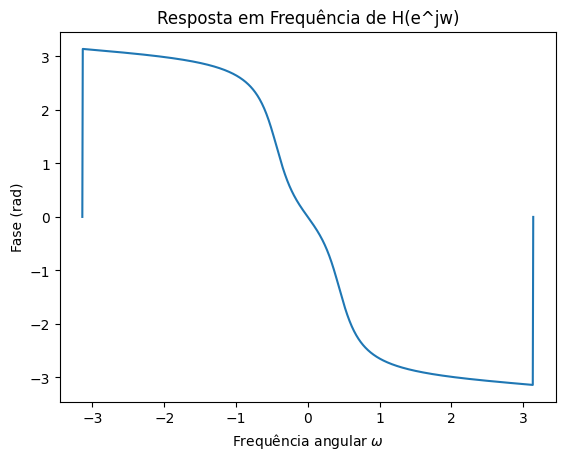

In [9]:
#Resposta da questão 2c

lam = 0.8

wc = 0.14 * np.pi

b0 = 1
b1 = 2
b2 = 1

a0 = 1
a1 = -2*lam*np.cos(wc)
a2 = lam**2

Omega = np.linspace(-np.pi, np.pi, 1000)
w_axis = np.exp(1j*Omega)

H = (b0 * w_axis**2 + b1*w_axis + b2)/(a0 * w_axis ** 2 + a1 * w_axis + a2)

H_mag_db = 10 * np.log10(abs(H))
H_phase = np.angle(H)

plt.plot(Omega, H_mag_db)
plt.title('Resposta em Frequência de H(e^jw)')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Magnitude (dB)')
plt.show()

plt.plot(Omega, H_phase)
plt.title('Resposta em Frequência de H(e^jw)')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Fase (rad)')
plt.show()



## Questão 2d (0.5  pontos)

Carregue o sinal de ECG "noisy_ecg_data_2.mat" e aplique o filtro projetado neste sinal. Plote o sinal antes da filtragem (x[n]) e o sinal após a filtragem (y[n]).

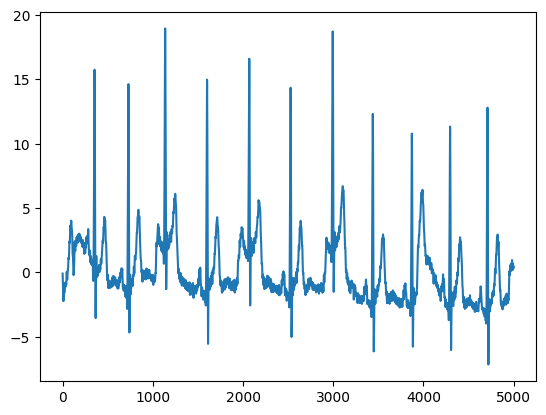

In [10]:
#Resposta da questão 2d

sinal = sp.io.loadmat('noisy_ecg_data_2.mat')['noisy_ecg2'].ravel()

novo_sinal = np.zeros(len(sinal))

novo_sinal[0] = sinal[0]
novo_sinal[1] = sinal[1] +b1*sinal[0] - a1*novo_sinal[0]

for i in range(2, len(novo_sinal)):
    novo_sinal[i] = b0 * sinal[i] + b1*sinal[i-1] + b2*sinal[i-2] - a1*novo_sinal[i-1] - a2*novo_sinal[i-2]
        
plt.plot(novo_sinal)

# Questão 3

Considere o filtro analógico:

$$ H_a \left(s\right) = \frac{\omega_c}{\omega_c + s}$$

E considere o valor:

$$\omega_c = 10^3 $$

## Questão 3a (1  ponto)

Projete uma aproximação digital para este filtro com critério de 10%. Indique a taxa de amostragem calculada para esta aproximação (T1) e compare a resposta em frequência do filtro projetado H1() com a resposta em frequência do filtro analógic Ha(). Plote as frequências até ao menos:

$$ \omega = 10^5 \pi $$

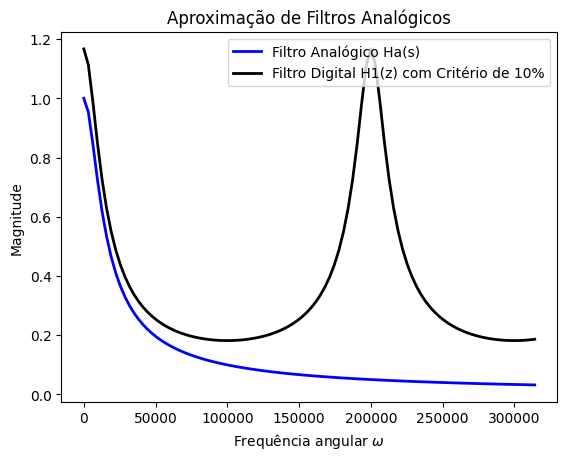

In [11]:
#Resposta da questão 3a
w = np.linspace(0, 10**5*np.pi, 100)
wc = 10e3;
Ha = wc / np.sqrt(w**2 + wc**2)

T1 = 10e-6 * np.pi # Critério de 10%
Hz1 = 0.3142 / np.sqrt(1.5333 - 1.4608 * np.cos(w*T1)) 



plt.plot(w, Ha,  'b-', linewidth=2, label='Filtro Analógico Ha(s)')
plt.plot(w, Hz1,  'k-', linewidth=2, label='Filtro Digital H1(z) com Critério de 10%')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Magnitude')
plt.title('Aproximação de Filtros Analógicos')
plt.legend()

## Questão 3b (1  ponto)

Projete uma aproximação digital para este filtro com critério de 1%. Indique a taxa de amostragem calculada para esta aproximação (T2) e compare a resposta em frequência do filtro projetado H2() com a resposta em frequência do filtro analógic Ha(). Plote as frequências até ao menos:

$$ \omega = 10^5 \pi $$

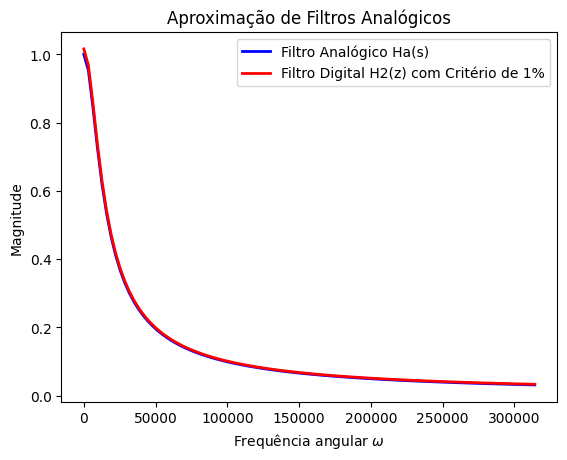

In [12]:
#Resposta da questão 3b

T2 = 10e-7*np.pi;
Hz2 = wc * T2 / np.sqrt(1 + np.exp(-2 * wc * T2) - 2 * np.exp(-wc * T2) * np.cos(w*T2));

plt.plot(w, Ha,  'b-', linewidth=2, label='Filtro Analógico Ha(s)')
plt.plot(w, Hz2, 'r-', linewidth=2, label='Filtro Digital H2(z) com Critério de 1%')
plt.xlabel('Frequência angular $\omega$')
plt.ylabel('Magnitude')
plt.title('Aproximação de Filtros Analógicos')
plt.legend()

## Questão 3c (1 ponto)

Calcule a resposta ao impulso ha(t) do filtro analógico Ha(s), bem como as respostas ao impulso h1[n] e h2[n] dos filtros projetados H1(z) e H2(z). **Plote** as respostas ao impulso na mesma escala.

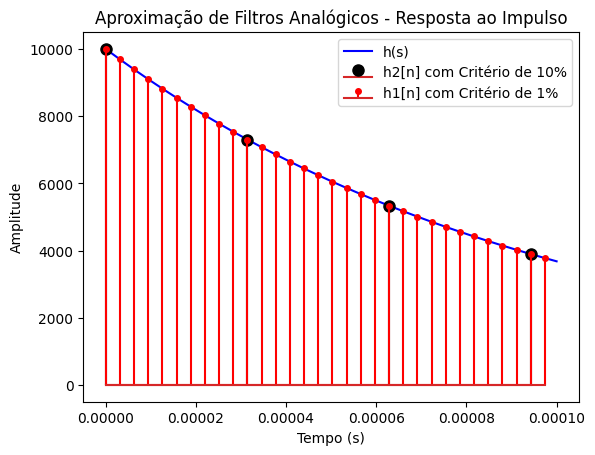

In [16]:
#Resposta da questão 3c

tmax = 0.0001;
t = np.arange(0, tmax, 1e-6)
ha = wc * np.exp(-wc*t);

n1 = np.arange(0, tmax/T1, 1)
h1 = wc * T1 * np.exp(-wc*T1*n1);

n2 = np.arange(0, tmax/T2, 1)
h2 = wc * T2 * np.exp(-wc*T2*n2);


plt.plot(t,ha,'b-', label='h(s)')



markers, stems, base = plt.stem(n1*T1,  h1/T1,  'k', label='h2[n] com Critério de 10%')
plt.setp(markers, markersize=8)
markers2, stems2, base2 = plt.stem(n2*T2, h2/T2, 'r', label='h1[n] com Critério de 1%')
plt.setp(markers2, markersize=4)

plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.title('Aproximação de Filtros Analógicos - Resposta ao Impulso')
plt.legend()

## Questão 3d (2 pontos)

Considere o sinal:
$$ x\left(t\right) = e^{- \lambda t} u\left(t\right)$$

com

$$\lambda = 500 $$

Calcule a resposta teórica do filtro analógico, y(t), bem como a resposta do filtro digital H1(z) ao sinal amostrado com taxa T1 (x1[n]) e a resposta do filtro digital H2(z) ao sinal amostrado com taxa T2 (x2[n]). **Plote**, na mesma escala, o sinal y(t) e as aproximações y1[n] e y2[n]. 

In [14]:
#Resposta da questão 3d